In [1]:
from neo import io
import neo
import numpy as np
from pathlib import Path
import matplotlib.pylab as plt 
import seaborn as sns
import pandas as pd
from pathlib import Path
from scipy import stats
from utils import *
from utils_analysis import *
from utils_spectral import *
from utils_BK_corr import *

/home/nix/Uni/3Year/Thesis/testStefania/multiLevels/utils_spectral.py:4: DeprecationWarning: 
The `fooof` package is being deprecated and replaced by the `specparam` (spectral parameterization) package.
This version of `fooof` (1.1) is fully functional, but will not be further updated.
New projects are recommended to update to using `specparam` (see Changelog for details).
  from fooof import FOOOF


In [2]:
sns.set_theme(style="dark")
sns.set_context("notebook")
plt.style.use('ggplot')
plt.rcParams['font.family'] = 'DejaVu Serif'
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.size'] = 8
plt.rcParams['axes.titlesize'] = 8
plt.rcParams['axes.labelsize'] = 6
plt.rcParams['figure.labelsize'] = 6
plt.rcParams['legend.fontsize'] = 6
plt.rcParams['figure.titlesize'] = 10
plt.rcParams['xtick.labelsize'] = 6
plt.rcParams['ytick.labelsize'] = 6
plt.rcParams['figure.figsize'] = (8.27, 6)

In [3]:
# loading the data
# spike_rows = []

# for file in Path("/home/nix/Uni/3Year/Thesis/testStefania/multiLevels/results_1.000/basal_activity").glob("*.nio"):
#     print(f"Leggo: {file.name}")
#     reader = neo.io.NixIO(filename=str(file), mode="ro")
#     block = reader.read_block()

#     for seg_idx, segment in enumerate(block.segments):
#        for st_idx, spiketrain in enumerate(segment.spiketrains):
#            spike_times = spiketrain.times.rescale("ms").magnitude
#             senders = spiketrain.annotations.get("senders", None)
#             device = spiketrain.annotations.get("device", "unknown")
#             pop_size = spiketrain.annotations.get("pop_size", None)

#             if senders and len(senders) == len(spike_times):
#                 for time, sender in zip(spike_times, senders):
#                     spike_rows.append({
#                         "time_ms": time,
#                         "sender_id": sender,
#                         "pop": device.split('_')[0],
#                         "segment": seg_idx,
#                         "file": file.name
#                     })
#             else:
#                 for time in spike_times:
#                     spike_rows.append({
#                         "time_ms": time,
#                         "sender_id": f"unit{st_idx}",
#                         "pop": device.split('_')[0],
#                         "segment": seg_idx,
#                         "file": file.name
#                     })

# df_spikes = pd.DataFrame(spike_rows)
# print("Pops:", df_spikes['pop'].unique())

In [4]:
# df_spikes.to_csv('/home/nix/Uni/3Year/Thesis/testStefania/multiLevels/pc_spikes.csv', index=False)

In [5]:
df_spikes = pd.read_csv('/home/nix/Uni/3Year/Thesis/testStefania/multiLevels/pc_spikes.csv')

Shape: (86590, 2)
[[4.90000e+00 3.31240e+04]
 [6.20000e+00 3.31540e+04]
 [1.86000e+01 3.31240e+04]
 ...
 [2.49696e+04 3.31100e+04]
 [2.49866e+04 3.31400e+04]
 [2.49885e+04 3.31100e+04]]
Computing firing rates of purkinje
Number of neurons: 68
Time vector: 0 25000.4
Number of bins: 5001
Kernel size: 8
Neuron ID: 33097.0
First few spikes: [ 8.5 27.9 52.  76.  97.7]
Neuron ID: 33098.0
First few spikes: [ 9.1 27.7 50.9 71.2 91. ]
Neuron ID: 33099.0
First few spikes: [ 6.1 22.7 42.3 66.1 86. ]
Rates array shape: (68, 5001)
Rates array first few values: [[31.25 43.75 50.   ... 18.75  6.25  0.  ]
 [31.25 43.75 50.   ... 50.   50.   43.75]
 [31.25 50.   62.5  ... 31.25 18.75  6.25]
 [18.75 31.25 50.   ... 31.25 18.75  6.25]
 [31.25 43.75 50.   ... 31.25 18.75  6.25]]
Rates array first few neurons: [[31.25 43.75 50.   50.   50.  ]
 [31.25 43.75 50.   50.   50.  ]
 [31.25 50.   62.5  62.5  62.5 ]
 [18.75 31.25 50.   62.5  62.5 ]
 [31.25 43.75 50.   50.   50.  ]
 [31.25 43.75 50.   50.   50.  ]
 

/home/nix/Uni/3Year/Thesis/testStefania/multiLevels/utils.py:248: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


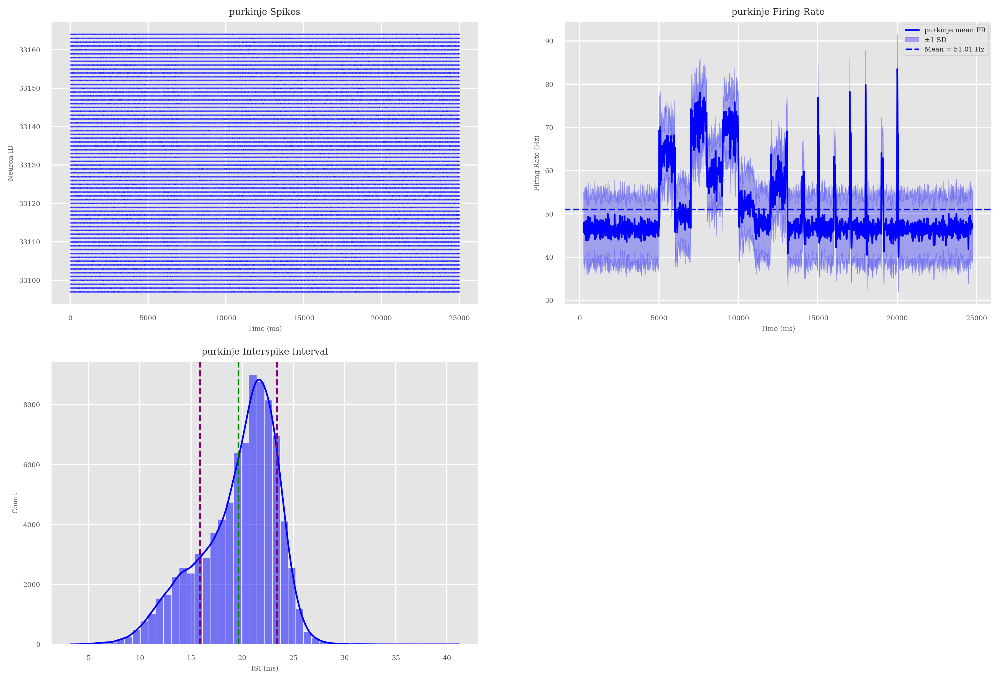

In [6]:
times_vectorPC, mean_ratePC, rates_per_neuronPC, stats_popPC, isi_dictPC, stats_dictPC, df_spikes = process_pop(df_spikes, "purkinje", color="blue", mask_flag=True, dt=5, sigma=20)

Coefficient of Variation: 0.2215
Mean ISI: 17.0432 +- 3.7743 ms
Min ISI: 4.2000 ms, Max ISI: 32.1000 ms
Duration of the interval: 7900.0 ms
Spikes in interval: 31515
------------------------------------------------------------
📊 Statistics for population Purkinje Cells:
Mean firing rate: 58.6882+/-8.7271
Max firing rate: 78.0331
Min firing rate: 44.2096
------------------------------------------------------------
📊 Statistics of Interspike intervals for population Purkinje Cells:
Mean ISI: 17.0432 +- 3.7743 ms
Min ISI: 4.2000 ms, Max ISI: 32.1000 ms
Coefficient of Variation: 0.2215


/home/nix/Uni/3Year/Thesis/testStefania/multiLevels/utils.py:248: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


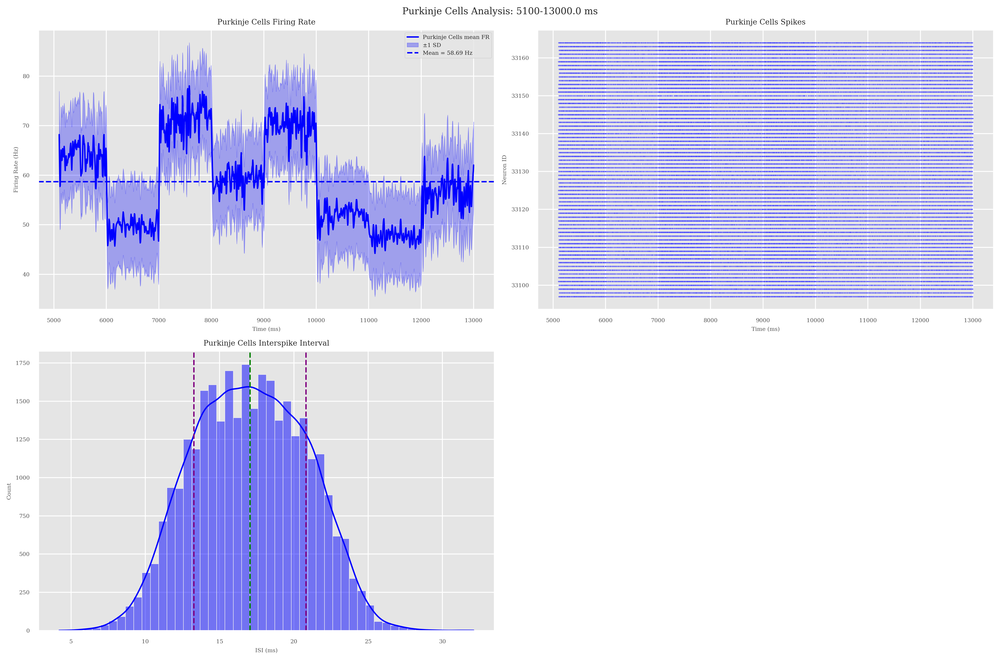

In [10]:
rates_per_neuronPC_stimulus_step, time_mask_stimulus_step, interval_spikes, isi_dict, isi_stats = extract_fr(
    spiking_data=df_spikes,
    times_vector=times_vectorPC,
    rates_per_neuron=rates_per_neuronPC,
    mean_rate=mean_ratePC,
    time_interval=(5100, 13000.0),
    pop='Purkinje Cells',
    color='blue',
    plot=True
)


In [8]:
rates_per_neuronPC_stimulus_step.shape, time_mask_stimulus_step.shape

((68, 1601), (4901,))

/home/nix/Uni/3Year/Thesis/testStefania/multiLevels/utils_analysis.py:41: FutureWarning: The behavior of obj[i:j] with a float-dtype index is deprecated. In a future version, this will be treated as positional instead of label-based. For label-based slicing, use obj.loc[i:j] instead
  sns.heatmap(heatmap_data.T[:100], ax=ax, cmap='plasma', cbar_kws={'label': 'Counts Frequencies'})


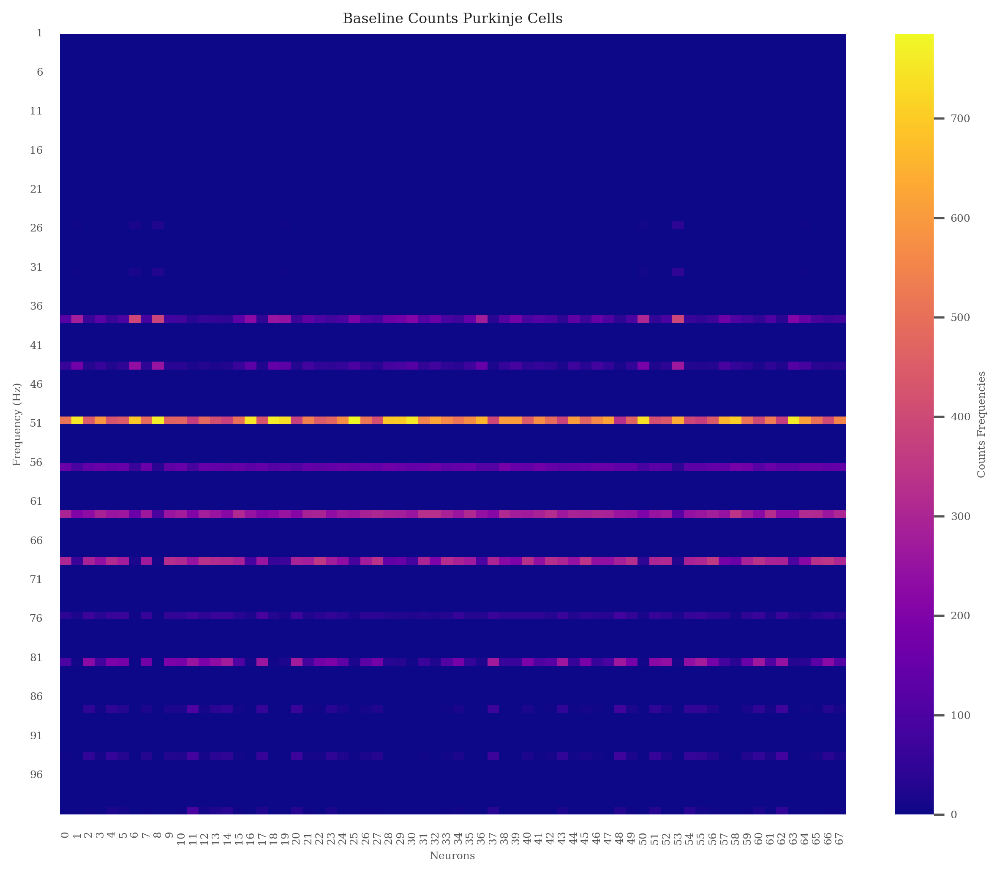

In [9]:
heatmap_step = heatmap_firing_rates(rates_per_neuronPC_stimulus_step)
plot_count_heatmap(heatmap_step, title='Baseline Counts Purkinje Cells')

In [10]:
print(f"Number of zero entries in baseline2_heatmap: {(heatmap_step == 0).sum().sum()}")
print(f"Number of total entries in baseline2_heatmap: {heatmap_step.size}\n")

Number of zero entries in baseline2_heatmap: 12754
Number of total entries in baseline2_heatmap: 13532



PCA explained variance ratio: [0.83015789 0.11786869]
PCA Summary:
PC1 explains 83.0% of variance
PC2 explains 11.8% of variance


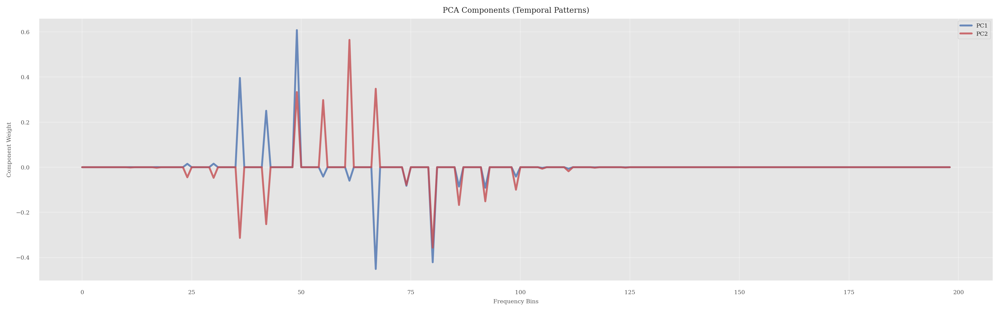

In [11]:
heatmap_pca, pca_obj = PCA_heatmap(heatmap_step, n_components=2)
_ = plot_pca_analysis(heatmap_step, pca_obj)

K-Means Clustering: 2 clusters
Silhouette Coefficient: 0.577


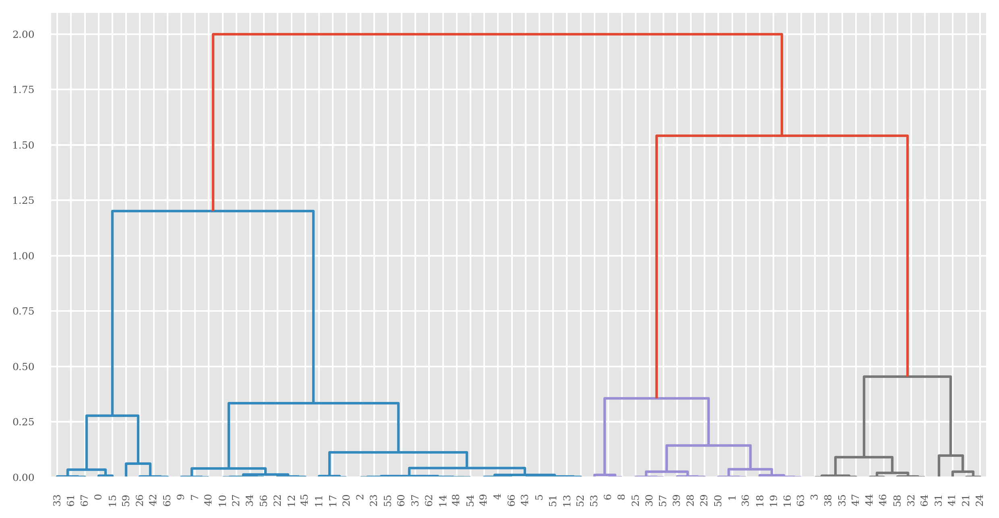

Hierarchical Clustering: 2 clusters
Silhouette Coefficient: 0.540
First 5 neurons (sorted by Cell ID):
   Cell_ID  Frequency Label  Original_Index
0        1  57.995003    ON               0
1        2  50.199094   OFF               1
2        3  63.596971    ON               2
3        4  57.171299    ON               3
4        5  63.573548    ON               4


/home/nix/miniconda3/envs/pytorch_env/lib/python3.12/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)
/home/nix/miniconda3/envs/pytorch_env/lib/python3.12/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)


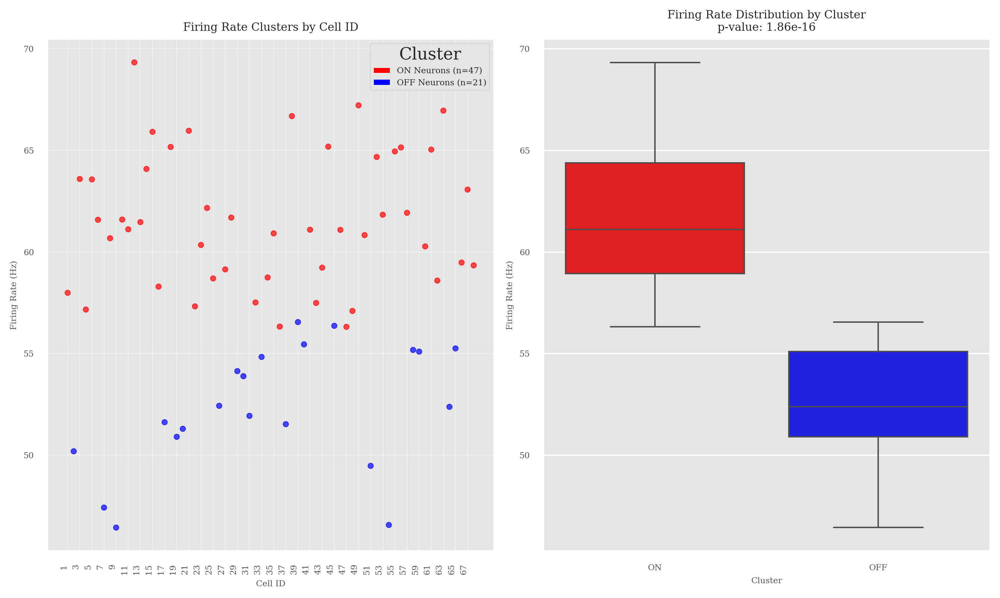

In [12]:
labels_step = kmeans_cluster(heatmap_pca, n_clusters=2)
hierarchical_labels_baseline = hierarchical_cluster(heatmap_pca, n_clusters=2)
neuronsON, neuronsOFF = plot_fr_clusters(rates_per_neuronPC_stimulus_step, labels_step)

In [13]:
mean_ratePC_step = np.mean(rates_per_neuronPC_stimulus_step, axis=0)

First 5 neurons (sorted by Cell ID):
   Cell_ID  Frequency Label  Original_Index
0        1  57.995003    ON               0
1        2  50.199094   OFF               1
2        3  63.596971    ON               2
3        4  57.171299    ON               3
4        5  63.573548    ON               4
------------------------------------------------------------
📊 Statistics for population Purkinje Cells:
Mean firing rate: 58.7223+/-8.6993
Max firing rate: 78.0331
Min firing rate: 44.2096


/home/nix/miniconda3/envs/pytorch_env/lib/python3.12/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)
/home/nix/miniconda3/envs/pytorch_env/lib/python3.12/site-packages/seaborn/categorical.py:700: PendingDeprecationWarning: vert: bool will be deprecated in a future version. Use orientation: {'vertical', 'horizontal'} instead.
  artists = ax.bxp(**boxplot_kws)
/tmp/ipykernel_20344/2558383591.py:28: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


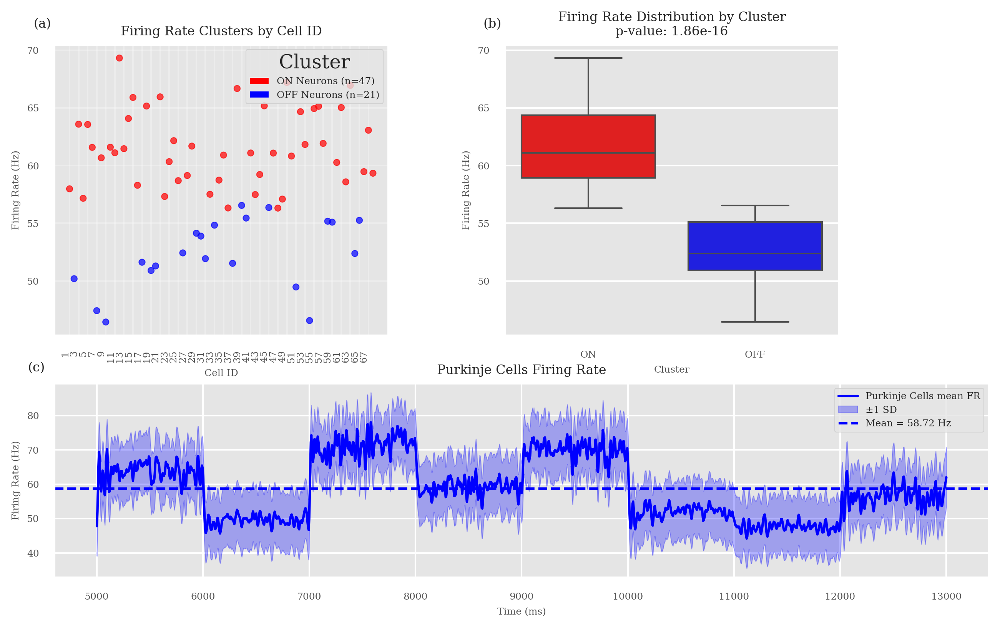

In [14]:
from matplotlib.gridspec import GridSpec
fig = plt.figure()
gs = GridSpec(2, 3, figure=fig,
              height_ratios=[1.5, 1], 
              width_ratios=[1, 1, 0.1],  # Equal width columns
              hspace=0.2, wspace=0.5, left=0.01, right=0.99)  # Reduced wspace from 0.5 to   1

# Top row - two larger subplots
ax1_left = fig.add_subplot(gs[0, 0])
ax1_right = fig.add_subplot(gs[0, 1])

# Bottom row - one smaller centered subplot spanning the middle area
ax2_center = fig.add_subplot(gs[1, 0:3])  # Span all 3 columns for better centering

# Plot clustering results on top row
plot_fr_clusters(
    rates_per_neuron=rates_per_neuronPC_stimulus_step,
    clusters=labels_step,
    ax=[ax1_left, ax1_right]
)
ax1_left.text(-0.01, 1.05, '(a)', transform=ax1_left.transAxes, va='bottom', ha='right')
ax1_right.text(-0.01, 1.05, '(b)', transform=ax1_right.transAxes, va='bottom', ha='right')

# Plot firing rate on centered bottom subplot
plot_firing_rate(times_vectorPC[time_mask_stimulus_step], mean_ratePC_step, ax=ax2_center, pop='Purkinje Cells', color='blue')
ax2_center.text(-0.01, 1.05, '(c)', transform=ax2_center.transAxes, va='bottom', ha='right')

plt.tight_layout()
plt.show()

Shape: (119955, 2)
[[2.21000e+01 6.40000e+01]
 [2.39000e+01 1.24000e+02]
 [2.42000e+01 4.00000e+00]
 ...
 [2.49959e+04 8.00000e+01]
 [2.49960e+04 5.00000e+01]
 [2.49981e+04 1.10000e+02]]
Computing firing rates of basket
Number of neurons: 150
Time vector: 0 25000.9
Number of bins: 5001
Kernel size: 8
Neuron ID: 1.0
First few spikes: [ 24.1 253.9 418.1 493.4 566.2]
Neuron ID: 2.0
First few spikes: [ 24.9 418.5 599.5 658.3 748.9]
Neuron ID: 3.0
First few spikes: [ 24.   93.2 185.8 208.4 251.1]
Rates array shape: (150, 5001)
Rates array first few values: [[ 0.    6.25 18.75 ...  0.    0.    0.  ]
 [ 0.    6.25 18.75 ...  0.    0.    0.  ]
 [ 0.    6.25 18.75 ... 31.25 43.75 43.75]
 [ 0.    6.25 18.75 ... 43.75 43.75 31.25]
 [ 0.    6.25 18.75 ...  0.    0.    0.  ]]
Rates array first few neurons: [[ 0.    6.25 18.75 31.25 43.75]
 [ 0.    6.25 18.75 31.25 43.75]
 [ 0.    6.25 18.75 31.25 43.75]
 [ 0.    6.25 18.75 31.25 43.75]
 [ 0.    6.25 18.75 31.25 43.75]
 [ 0.    6.25 18.75 31.25 43.7

/home/nix/Uni/3Year/Thesis/testStefania/multiLevels/utils.py:242: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


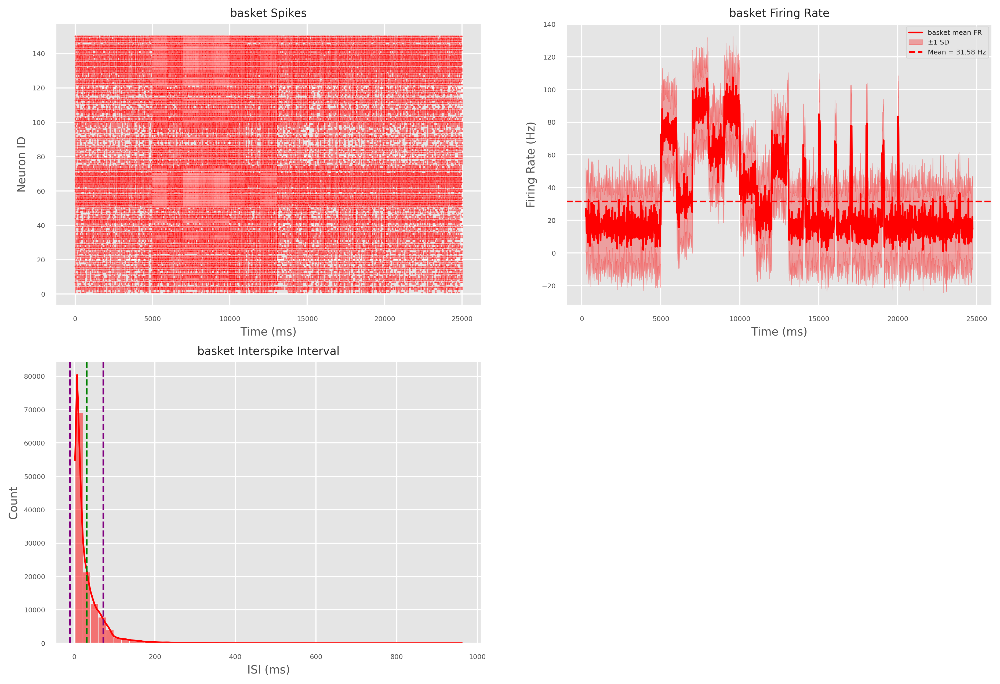

In [13]:
times_vectorBK, mean_rateBK, rates_per_neuronBK, stats_popBK, isi_dictBK, stats_dictBK = process_pop(df_spikes, "basket", color="red", mask_flag=True, dt=5, sigma=20)

Duration of the interval: 8000.0 ms
------------------------------------------------------------
📊 Statistics for population Basket Cells:
Mean firing rate: 58.2592+/-24.0538
Max firing rate: 107.5000
Min firing rate: 7.5000


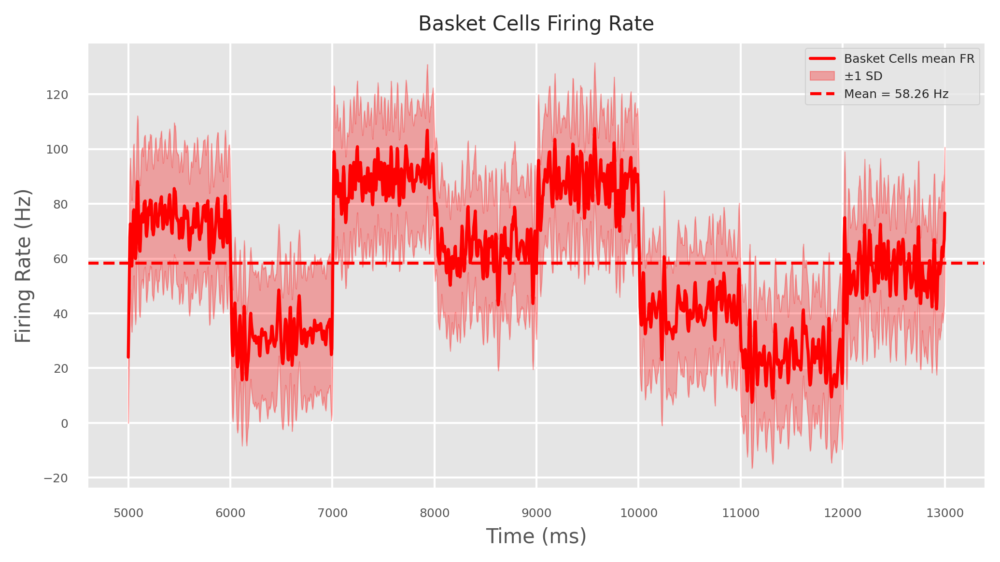

In [14]:
rates_per_neuronBK_stimulus_step, time_mask_stimulus_step = extract_fr(times_vectorBK, rates_per_neuronBK, mean_rateBK, time_interval=(5000, 13000.0), pop='Basket Cells', color='red', plot=True)

Shape: (202864, 2)
[[8.00000e+00 3.34540e+04]
 [2.35000e+01 3.33040e+04]
 [2.37000e+01 3.33340e+04]
 ...
 [2.49941e+04 3.33800e+04]
 [2.49960e+04 3.32000e+04]
 [2.49999e+04 3.34100e+04]]
Computing firing rates of stellate
Number of neurons: 300
Time vector: 0 25000.9
Number of bins: 5001
Kernel size: 8
Neuron ID: 33165.0
First few spikes: [ 23.7  86.7 143.4 171.2 201.3]
Neuron ID: 33166.0
First few spikes: [ 23.8  85.1 139.3 180.5 208.1]
Neuron ID: 33167.0
First few spikes: [ 24.2 259.6 321.1 478.2 539.5]
Rates array shape: (300, 5001)
Rates array first few values: [[ 0.    6.25 18.75 ... 62.5  50.   31.25]
 [ 0.    6.25 18.75 ... 43.75 43.75 31.25]
 [ 0.    6.25 18.75 ...  0.    0.    0.  ]
 [ 0.    6.25 18.75 ... 43.75 43.75 31.25]
 [ 0.    6.25 18.75 ...  0.    0.    0.  ]]
Rates array first few neurons: [[ 0.    6.25 18.75 31.25 43.75]
 [ 0.    6.25 18.75 31.25 43.75]
 [ 0.    6.25 18.75 31.25 43.75]
 ...
 [ 0.    6.25 18.75 31.25 43.75]
 [ 0.    6.25 18.75 31.25 43.75]
 [ 0.    6.

/home/nix/Uni/3Year/Thesis/testStefania/multiLevels/utils.py:242: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


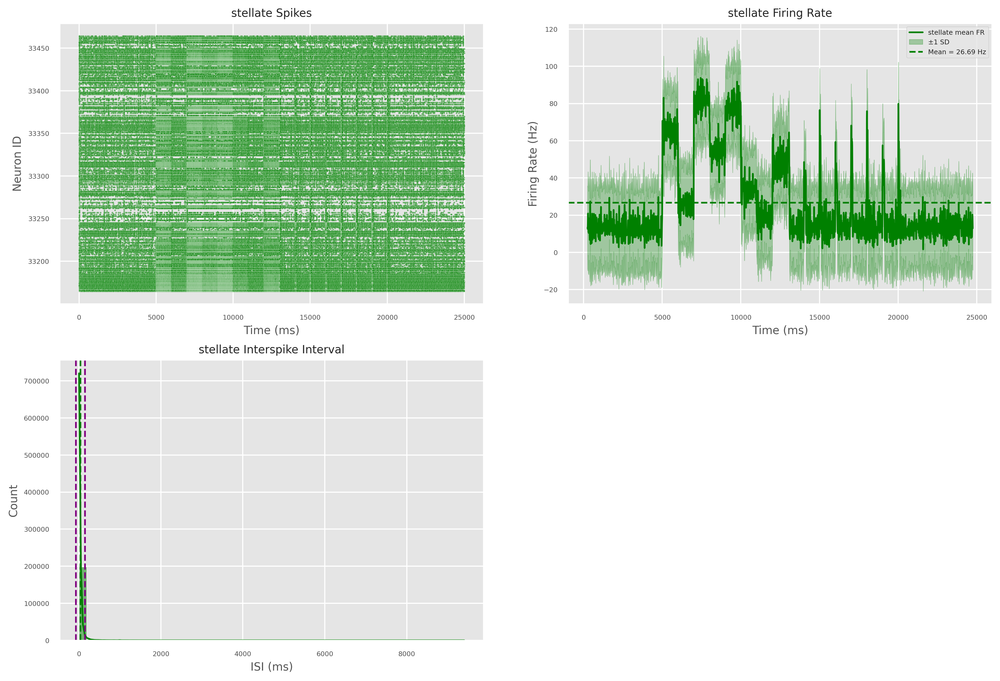

In [10]:
times_vectorST, mean_rateST, rates_per_neuronST, stats_popST, isi_dictST, stats_dictST = process_pop(df_spikes, "stellate", color="green", mask_flag=True, dt=5, sigma=20)

Duration of the interval: 8000.0 ms
------------------------------------------------------------
📊 Statistics for population Stellate Cells:
Mean firing rate: 50.5695+/-22.7520
Max firing rate: 93.7917
Min firing rate: 6.7500


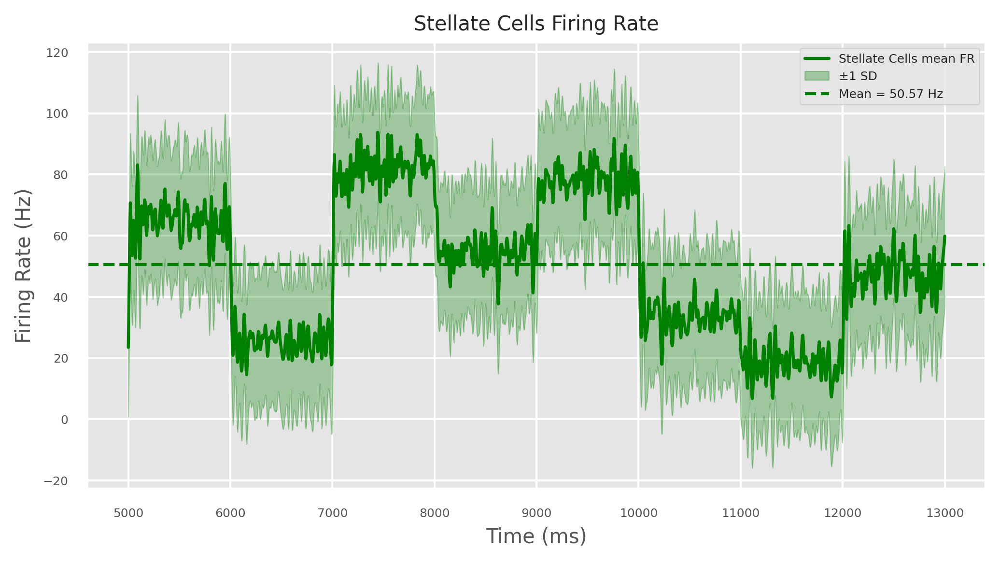

In [11]:
rates_per_neuronST_stimulus_step, time_mask_stimulus_step = extract_fr(times_vectorST, rates_per_neuronST, mean_rateST, time_interval=(5000, 13000.0), pop='Stellate Cells', color='green', plot=True)

In [15]:
step_rates_per_neuronMLI = np.vstack((rates_per_neuronST_stimulus_step, rates_per_neuronBK_stimulus_step))
print("Shape of baseline rates per neuron for MLI:", step_rates_per_neuronMLI.shape)

Shape of baseline rates per neuron for MLI: (450, 1601)


10000.0
Computed power spectrum for 68 neurons with 512 frequency bins.
Frequency range: 9.77 - 5000.00 Hz
PSD shape: (68, 512)


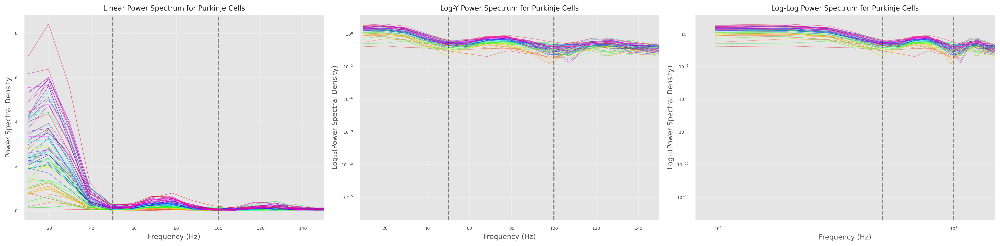

In [7]:
freqs_pc, psd_pc = compute_power_spectrum(rates_per_neuronPC_stimulus_step, dt=0.1, nperseg=1024)

print(f"Frequency range: {freqs_pc[0]:.2f} - {freqs_pc[-1]:.2f} Hz")
print(f"PSD shape: {psd_pc.shape}")
plot_power_spectrum(freqs_pc, psd_pc, 'Purkinje Cells', n_neurons_to_plot=rates_per_neuronPC_stimulus_step.shape[0], log_plot=True)

In [8]:
# Create DataFrame directly from psd_pc
psd_df = pd.DataFrame(psd_pc, columns=[f'Freq_{freq:.2f}' for freq in freqs_pc])

# Save to CSV
psd_df.to_csv('/home/nix/Uni/3Year/Thesis/testStefania/multiLevels/psdPC_full_step.csv', index=False)

10000.0
Computed power spectrum for 450 neurons with 512 frequency bins.
Frequency range: 9.77 - 5000.00 Hz
PSD shape: (450, 512)


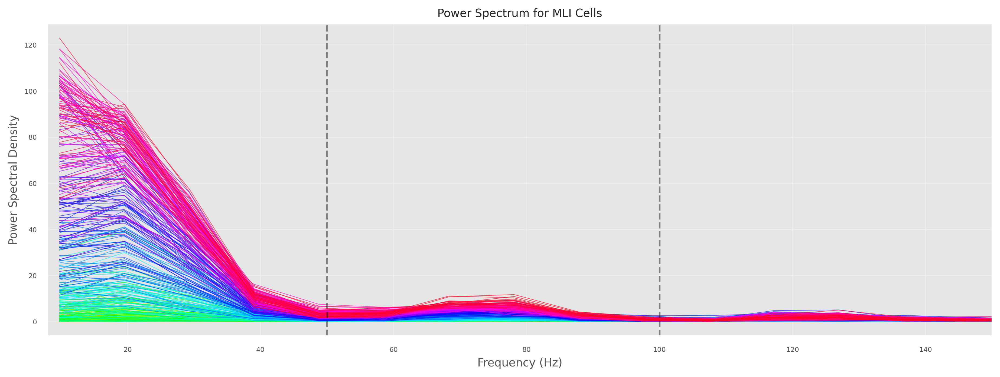

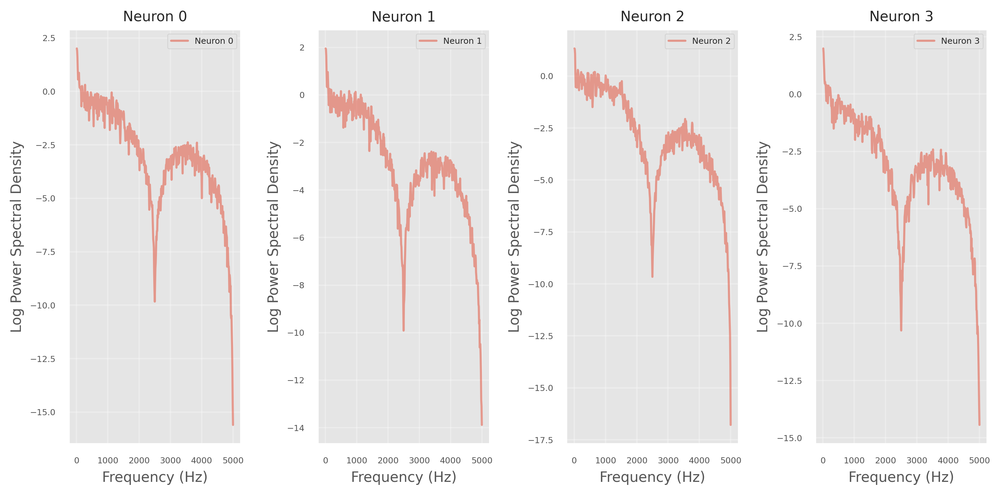

In [ ]:
freqs_MLI, psd_MLI = compute_power_spectrum(step_rates_per_neuronMLI, dt=0.1, nperseg=1024)
print(f"Frequency range: {freqs_MLI[0]:.2f} - {freqs_MLI[-1]:.2f} Hz")
print(f"PSD shape: {psd_MLI.shape}")
plot_power_spectrum(freqs_MLI, psd_MLI, 'MLI Cells', n_neurons_to_plot=step_rates_per_neuronMLI.shape[0])

In [21]:
# Check for zero frequencies in the power spectrum
# This is to ensure that the power spectrum is computed correctly and does not contain any zero frequencies

np.sum(freqs_pc == 0.0)

np.int64(0)

In [22]:
# veryfying the frequency range and shape of the power spectrum
print(f"Shape of psd_pc: {psd_pc.shape}")
print(f"minimum of freqs_pc: {freqs_pc[0]:.2f} Hz")
print(f"maximum of freqs_pc: {freqs_pc[-1]:.2f} Hz\n")

print(f"Shape of psd_MLI: {psd_MLI.shape}")
print(f"minimum of freqs_MLI: {freqs_MLI[0]:.2f} Hz")
print(f"maximum of freqs_MLI: {freqs_MLI[-1]:.2f} Hz")
print(f"Shape of psd_MLI: {psd_MLI.shape}")

Shape of psd_pc: (68, 512)
minimum of freqs_pc: 9.77 Hz
maximum of freqs_pc: 5000.00 Hz

Shape of psd_MLI: (450, 512)
minimum of freqs_MLI: 9.77 Hz
maximum of freqs_MLI: 5000.00 Hz
Shape of psd_MLI: (450, 512)


/home/nix/Uni/3Year/Thesis/testStefania/multiLevels/utils_BK_corr.py:30: RuntimeWarning: invalid value encountered in divide
  standardized_ratesMLI = centered_ratesMLI / np.std(centered_ratesMLI, axis=1, keepdims=True)


Shape of correlation matrix ON: (450, 47)
Shape of correlation matrix OFF: (450, 21)
Shape of combined correlation matrix: (450, 68)
X labels: [1, 6, 8, 16, 18, 19, 25, 28, 29, 30, 32, 36, 38, 39, 44, 50, 53, 57, 58, 63, 64, 0, 2, 3, 4, 5, 7, 9, 10, 11, 12, 13, 14, 15, 17, 20, 21, 22, 23, 24, 26, 27, 31, 33, 34, 35, 37, 40, 41, 42, 43, 45, 46, 47, 48, 49, 51, 52, 54, 55, 56, 59, 60, 61, 62, 65, 66, 67]
Min p-value: nan, Max p-value: nan
Significant p-values (alpha=0.05): 27201 out of 30600


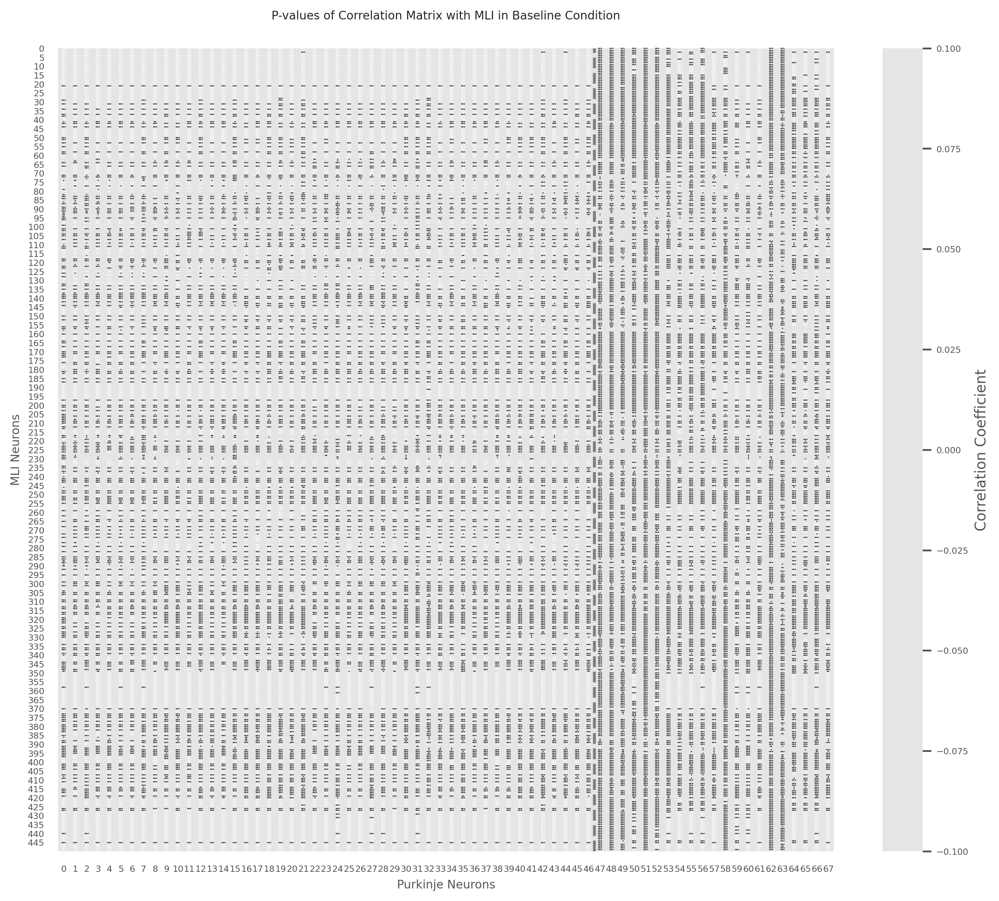

In [23]:
corr_matrixBKPC, neurons_bound, neuronsON, neuronsOFF = relate_MLI_to_pc(step_rates_per_neuronMLI, rates_per_neuronPC_stimulus_step, clusters=labels_step)
p_valuesPC = compute_pvalue(corr_matrixBKPC, dof=step_rates_per_neuronMLI.shape[1] - 2)
plot_pvalue_corr(corr_matrixBKPC, p_valuesPC, neuronsOFF, neuronsON, title='P-values of Correlation Matrix with MLI in Baseline Condition', neurons_boundary=neurons_bound, alpha=0.05)

In [24]:
# foof_features = extract_fooof_features(psd_pc, freqs_pc)

In [29]:
foof_features = pd.read_csv(Path("/home/nix/Uni/3Year/Thesis/testStefania/multiLevels/foof_features_step.csv"))

In [30]:
foof_features.head()

,Peak1_Freq,Peak1_Power,Peak1_Bandwidth,Aperiodic_Offset,Aperiodic_Exponent,Total_Energy_Entire_PSD,Mean_Phase,Std_Phase,Mean_Firing_Rate,Total_Energy
0,3399.090330,3.631403,758.873747,6.418347,3.502951,14.475461,3.203112,1.816222,57.995003,10.801017
1,3556.821163,3.157383,687.510521,6.231255,3.463540,8.997598,3.531396,1.662311,50.199094,5.827142
2,3647.753113,3.698711,1037.057559,6.687392,3.560257,23.360768,3.181966,1.773890,63.596971,11.198039
3,3270.509246,3.336793,639.845167,6.260145,3.439550,14.843195,3.046246,1.759014,57.171299,17.411144
4,3910.672102,3.570519,586.470582,6.788007,3.640403,22.937851,3.082806,1.761250,63.573548,19.380841


In [ ]:
# mean_phase_per_neuronPC, std_phase_per_neuronPC  = hilbert_phase(rates_per_neuronPC_stimulus_step)
# foof_features['Mean_Phase'] = mean_phase_per_neuronPC
# foof_features['Std_Phase'] = std_phase_per_neuronPC

Statistics:
Mean phase per neuron shape: (68,)
Std phase per neuron shape: (68,)
Mean phase per neuron: [3.20311208 3.53139596 3.18196553 3.04624585 3.08280572]
Std phase per neuron: [1.81622177 1.66231055 1.77389029 1.75901363 1.76125027]
Mean phase per neuron max: 6.260068404671003
Mean phase per neuron min: 0.023745564034626784


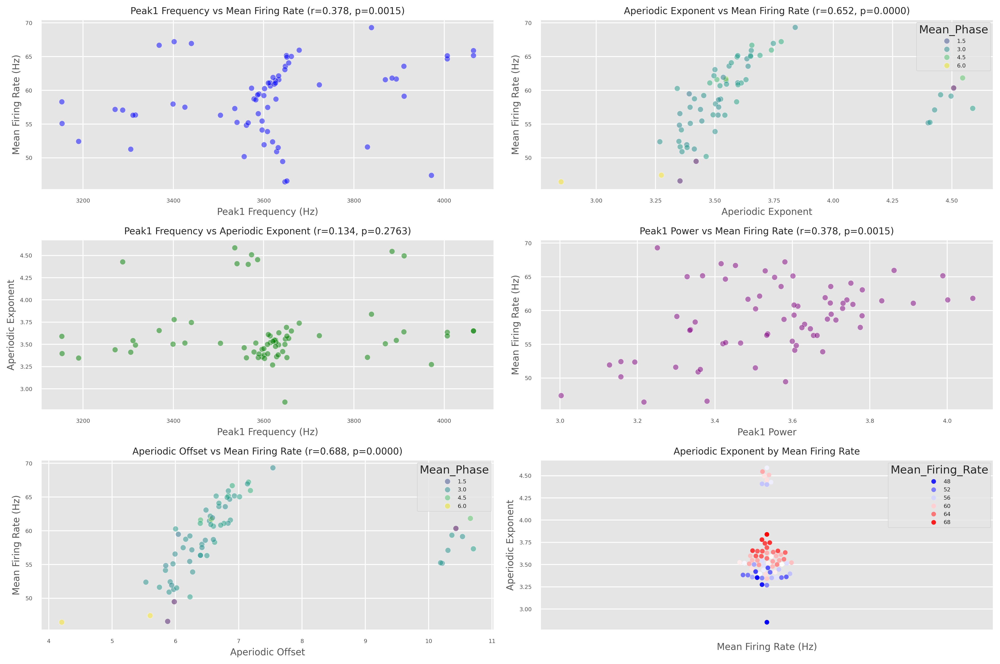

In [31]:
mean_rate = rates_per_neuronPC_stimulus_step.mean(axis=1)
mean_rateBK = rates_per_neuronBK_stimulus_step.mean(axis=1)
# foof_features['Mean_Firing_Rate'] = mean_rate

fig, axs = plt.subplots(3, 2, figsize=(15, 10), dpi=300)

# Mean Freq vs Peak Freq
pvalue1, r1 = corr_pvalue(foof_features['Peak1_Freq'], foof_features['Mean_Firing_Rate'])
sns.scatterplot(data=foof_features, x='Peak1_Freq', y='Mean_Firing_Rate', ax=axs[0, 0], color='blue', alpha=0.5)
axs[0, 0].set_title(f'Peak1 Frequency vs Mean Firing Rate (r={r1:.3f}, p={pvalue1:.4f})')
axs[0, 0].set_xlabel('Peak1 Frequency (Hz)')
axs[0, 0].set_ylabel('Mean Firing Rate (Hz)')

# Mean Freq vs Slope
pvalue2, r2 = corr_pvalue(foof_features['Aperiodic_Exponent'], foof_features['Mean_Firing_Rate'])
sns.scatterplot(data=foof_features, x='Aperiodic_Exponent', y='Mean_Firing_Rate', ax=axs[0, 1], color='red', alpha=0.5, hue='Mean_Phase', palette='viridis')
axs[0, 1].set_title(f'Aperiodic Exponent vs Mean Firing Rate (r={r2:.3f}, p={pvalue2:.4f})')
axs[0, 1].set_xlabel('Aperiodic Exponent')
axs[0, 1].set_ylabel('Mean Firing Rate (Hz)')

# Peak Freq vs Aperiodic Offset
pvalue3, r3 = corr_pvalue(foof_features['Peak1_Freq'], foof_features['Aperiodic_Exponent'])
sns.scatterplot(data=foof_features, x='Peak1_Freq', y='Aperiodic_Exponent', ax=axs[1, 0], color='green', alpha=0.5)
axs[1, 0].set_title(f'Peak1 Frequency vs Aperiodic Exponent (r={r3:.3f}, p={pvalue3:.4f})')
axs[1, 0].set_xlabel('Peak1 Frequency (Hz)')
axs[1, 0].set_ylabel('Aperiodic Exponent')   

# Power vs Mean Firing Rate
pvalue4, r4 = corr_pvalue(foof_features['Peak1_Power'], foof_features['Mean_Firing_Rate'])
sns.scatterplot(data=foof_features, x='Peak1_Power', y='Mean_Firing_Rate', ax=axs[1, 1], color='purple', alpha=0.5)
axs[1, 1].set_title(f'Peak1 Power vs Mean Firing Rate (r={r4:.3f}, p={pvalue4:.4f})')
axs[1, 1].set_xlabel('Peak1 Power')
axs[1, 1].set_ylabel('Mean Firing Rate (Hz)')

# Aperiodic Offset vs Mean Firing Rate color coded by Mean Phase
pvalue5, r5 = corr_pvalue(foof_features['Aperiodic_Offset'], foof_features['Mean_Firing_Rate'])
sns.scatterplot(data=foof_features, x='Aperiodic_Offset', y='Mean_Firing_Rate', ax=axs[2, 0], color='orange', alpha=0.5, hue='Mean_Phase', palette='viridis')
axs[2, 0].set_title(f'Aperiodic Offset vs Mean Firing Rate (r={r5:.3f}, p={pvalue5:.4f})')
axs[2, 0].set_xlabel('Aperiodic Offset')
axs[2, 0].set_ylabel('Mean Firing Rate (Hz)')

# Swarm plot of aperiodic exponent by firing rate
sns.swarmplot(data=foof_features, y='Aperiodic_Exponent', hue='Mean_Firing_Rate', palette='bwr')
axs[2, 1].set_title('Aperiodic Exponent by Mean Firing Rate')
axs[2, 1].set_xlabel('Mean Firing Rate (Hz)')
axs[2, 1].set_ylabel('Aperiodic Exponent')

plt.tight_layout()
plt.show()

Frequencies spacing in psd: 9.77 Hz
number of frequencies in the range 40-110 Hz: 7
Extracted frequencies in the range: [ 48.828125  58.59375   68.359375  78.125     87.890625  97.65625
 107.421875]
Shape of psd_masked: (68, 7)
Shape of psd_pc_energy: (68,)


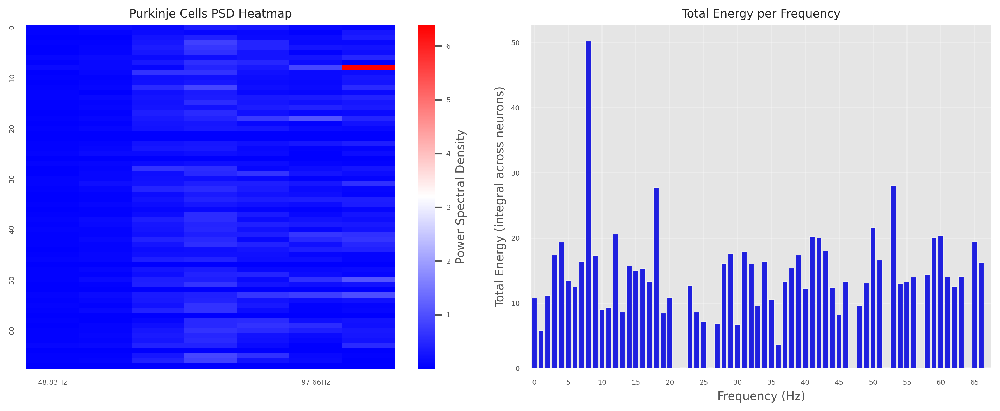

Frequency range: 48.8 - 107.4 Hz
Total energy across all frequencies: 891.29


In [32]:
psd_no_aperiodic = psd_without_aperiodic(psd_pc, freqs_pc, foof_features)
psd_pc_masked, freqs_mask = psd_mask(freqs_pc, psd_no_aperiodic, range_mask=(40, 110))

# Calculate total energy per neuron (integral across frequencies)
psd_pc_energy = np.trapezoid(psd_pc_masked.values, dx=freqs_pc[1] - freqs_pc[0], axis=1)

print(f"Shape of psd_pc_energy: {psd_pc_energy.shape}")
psd_pc_energy = pd.DataFrame(psd_pc_energy, columns=['Energy'])
extracted_freqs = freqs_pc[freqs_mask]

fig, ax = plt.subplots(1, 2, figsize=(12, 5), dpi=300)

# Left plot: PSD heatmap (neurons x frequencies)
ax[0].set_title('Purkinje Cells PSD Heatmap')
ax[0].set_xlabel('Frequency (Hz)')
ax[0].set_ylabel('Neurons')
sns.heatmap(psd_pc_masked, cmap='bwr', cbar_kws={'label': 'Power Spectral Density'}, 
            yticklabels=10, xticklabels=5, ax=ax[0])

# Right plot: Total energy per frequency
ax[1].set_title('Total Energy per Frequency')
ax[1].set_xlabel('Frequency (Hz)')
ax[1].set_ylabel('Total Energy (integral across neurons)')
sns.barplot(x=psd_pc_energy.index, y=psd_pc_energy['Energy'], color='blue', ax=ax[1])
ax[1].set_xticks(np.arange(0, len(psd_pc_energy.index), 5))
ax[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Print some statistics
print(f"Frequency range: {extracted_freqs[0]:.1f} - {extracted_freqs[-1]:.1f} Hz")
print(f"Total energy across all frequencies: {np.sum(psd_pc_energy['Energy']):.2f}")

In [ ]:
# psd_pc_masked = pd.DataFrame(psd_pc_masked)
# psd_pc_masked.to_csv('/home/nix/Uni/3Year/Thesis/testStefania/multiLevels/psdPC_step.csv', index=False)

In [ ]:
# foof_features['Total_Energy'] = psd_pc_energy['Energy'].values

In [ ]:
# foof_features.to_csv("/home/nix/Uni/3Year/Thesis/testStefania/multiLevels/foof_features_step.csv", index=False)

In [36]:
results_corr = MLI_pc_exponent_analysis(foof_features, step_rates_per_neuronMLI, rates_per_neuronPC_stimulus_step, labels_step)

Shape of population MLI activity: (1601,)
Shape of population PC activity: (1601,)
Shape of mean PC rates: (68,)
Population MLI-PC correlation: 0.980 and p-value: 0.0000
PC firing rate vs aperiodic exponent correlation: 0.652 and p-value: 0.0000
PC-MLI correlation strength vs aperiodic exponent: 0.636, p:0.0000
ON neurons - PC-MLI corr vs aperiodic exp: 0.375, p:0.0095
OFF neurons - PC-MLI corr vs aperiodic exp: 0.357, p:0.1120


Overall correlation between PC-basket strength and aperiodic exponent: 0.636 (p=0.0000)


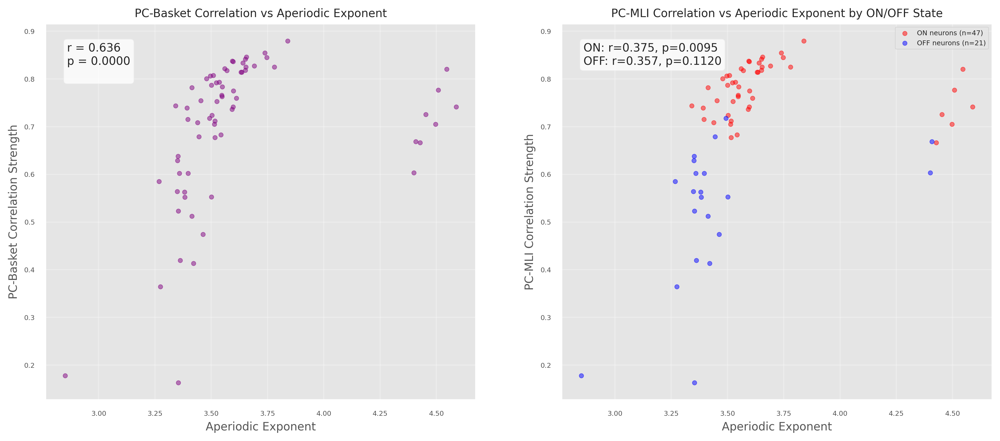

In [37]:
plot_pc_MLI_vs_exponent(results_corr, labels_step)

In [38]:
results_corr['Cluster'] = labels_step

In [39]:
results_corr.to_csv("/home/nix/Uni/3Year/Thesis/testStefania/multiLevels/correlation_results_step.csv", index=False)

Shape of centered ratesPC: (68, 1601)
Shape of mean_BK: (1601,)
Estimated Mutual Information: [0.37252697 0.16545659 0.59423129 0.35894982 0.59416555 0.51830271
 0.08626488 0.52230797 0.03233752 0.52867997 0.40340662 0.68298078
 0.4083452  0.51150595 0.55226127 0.37496823 0.18445002 0.59382935
 0.11191734 0.13818246 0.61145015 0.39062619 0.4138692  0.46865447
 0.38390732 0.16815458 0.32120948 0.41366249 0.21298659 0.17136148
 0.19654876 0.27860146 0.26019361 0.44605761 0.49453881 0.33374415
 0.18563713 0.60192456 0.27057164 0.35627015 0.49191458 0.37261397
 0.41110859 0.52565759 0.3622839  0.39288149 0.32015014 0.31802195
 0.53755813 0.41242141 0.10582484 0.47834992 0.54362782 0.06218235
 0.54983471 0.58152666 0.45101541 0.21630371 0.23773522 0.35741349
 0.50587567 0.33662002 0.58027068 0.19885024 0.27227075 0.35490378
 0.44645216 0.35478654]


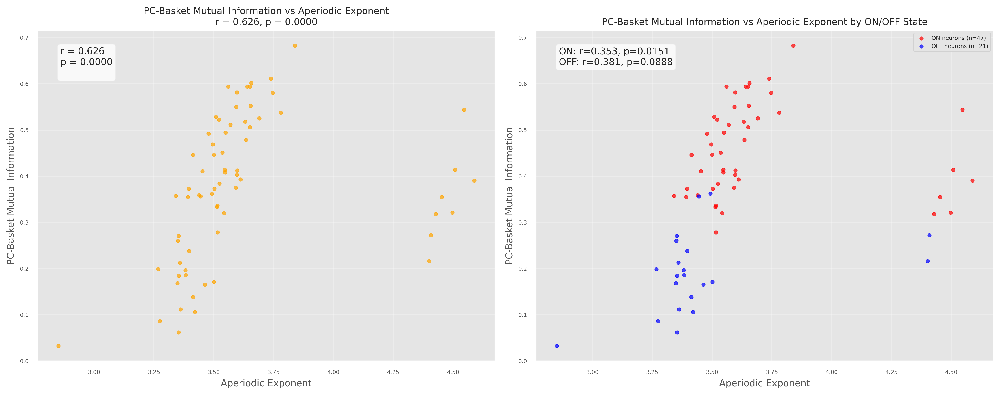

Overall correlation between PC-basket MI and aperiodic exponent: 0.626 (p=0.0000)


In [ ]:
est_MI = mutual_info(rates_per_neuronPC_stimulus_step, rates_per_neuronBK_stimulus_step)
plot_pc_basketMI_vs_exponent(est_MI, foof_features, labels_step)